# Necessary Imports

In [1]:
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
from scipy.stats import skew
import sys
import hdbscan
import umap
import umap.plot
import torch
import torchvision
from skimage.measure import regionprops, label
import skimage 




In [4]:
%load_ext autoreload
%autoreload 2


import importlib  
au = importlib.import_module("cell-AAP.cell_AAP.annotation.annotation_utils")
sys.path.append('/home/anishjv/cell_seg_classify/notebooks/cell-AAP/cell_AAP/annotation/')
sys.path.append('/home/anishjv/cell_seg_classify/notebooks/cell-AAP/')
ann = importlib.import_module("cell-AAP.cell_AAP.annotation.annotator")
dw = importlib.import_module("cell-AAP.cell_AAP.annotation.dataset_write")
cfg = importlib.import_module("cell-AAP.cell_AAP.configs")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Below we load in the SAM model, here we have chosen "vit_l.pt" which is a biologically finetuned model trained by the creators of micro-sam.


In [5]:
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor
from segment_anything.modeling import Sam

#Code below should be run if file is not already saved in path 
#!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth

sam_checkpoint = "vit_l.pt"
model_type = "vit_l"
device = 'cuda'
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device = device)
predictor = SamPredictor(sam)

Here we load in a test image and test parameters for the function "preprocess_3d". This function is responsible for locating individual cells within the Cell-APP pipeline, and there are many parameters to adjust to ensure that all cells in your test image are localized correctly. 

Some notable parameters:
- threshold_type: "watershed", "single", or "multi" [whether to use watershed segmentation, otsu's method with one threshold, or otsu's method with multiple thresholds]
- sigma: standard deviation for gaussian filter used for image smoothing 
- erosionstruct: structring element used for erosion [used to seperate touching cells, most important when not using watershed segmentation]

A full list of parameters can be found at: https://github.com/anishjv/cell-AAP/blob/main/cell_AAP/defaults.py

In [ ]:
test_mov = tiff.imread( '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_B06_s5_Texas Red.tif')[105:106]


processed_mov, region_props = au.preprocess_3d(
    test_mov, 
    threshold_division = .9,
    sigma = 2,
    threshold_type = 'watershed',
    erosionstruct = skimage.morphology.square(5),
    tophatstruct = skimage.morphology.disk(71),
)

In [ ]:
fig, ax = plt.subplots(ncols = 2, figsize = (15,15))
ax[0].imshow(test_mov[0])
ax[1].imshow(processed_mov)


for i, cell in enumerate(region_props['Frame_0']):
    y = cell.centroid[0]
    x = cell.centroid[1]
    ax[0].plot(x, y, '.')
    


List of movies used to create the dataset

In [8]:
new_flouro = [
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_A01_s1_Texas Red.tif', 
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_A01_s2_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_B01_s2_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_A01_s5_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_B01_s5_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_B01_s6_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_C01_s4_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_C01_s5_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_C01_s6_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s3_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s4_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s5_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s6_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s7_Texas Red.tif',
                           '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_A06_s2_Texas Red.tif',
                           '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_A06_s6_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_B06_s2_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_B06_s4_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_B06_s5_Texas Red.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_D06_s6_Texas Red.tif',
]

new_phs = [
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_A01_s1_phs.tif', 
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_A01_s2_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_B01_s2_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_A01_s5_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_B01_s5_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_B01_s6_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_C01_s4_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_C01_s5_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_C01_s6_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s3_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s4_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s5_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s6_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201105_HT1080-U2OS_D01_s7_phs.tif',
                           '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_A06_s2_phs.tif',
                           '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_A06_s6_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_B06_s2_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_B06_s4_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_B06_s5_phs.tif',
                          '/nfs/turbo/umms-ajitj/anishjv/data_movies/U20S/20201120_gsk experiment_D06_s6_phs.tif',
]





                          
                          
                          
    
                          
                             

Here we instaniate a configuration and modify it based on the testing we carried out above. 

We then call Annotator.get() which takens in our config instance as well as the transmitted light and flourescent movies. 

In [9]:
%%time
configs = cfg.Cfg.get_config()
configs.frame_step = 15
configs.erosion_struct = skimage.morphology.square(5)
configs.tophat_struct = skimage.morphology.square(71)
configs.threshold_division = .9
configs.sigma = 2
configs.threshold_type = 'watershed'
configs.box_size = (au.get_box_size, (2.2,))
configs.iou_thresh = .75


def sd_intensity(regionmask, intensity_image):
        return np.std(intensity_image[regionmask])

instance_whole = ann.Annotator.get(configs,
                                   new_flouro,
                                   new_phs
                     )

df_whole = instance_whole.crop(predictor = predictor).gen_df(extra_props = (sd_intensity,))

The bounding box side length was 118.95751060488736 pixels
The bounding box side length was 116.89573157732653 pixels
The bounding box side length was 121.23656124555248 pixels
The bounding box side length was 114.72429923211564 pixels
The bounding box side length was 116.01552138641027 pixels
The bounding box side length was 113.59028017671493 pixels
The bounding box side length was 111.27334294014092 pixels
The bounding box side length was 108.12695130449723 pixels
The bounding box side length was 122.46978756483703 pixels
The bounding box side length was 125.14526214853703 pixels
The bounding box side length was 129.49772692652863 pixels
The bounding box side length was 128.3276220261095 pixels
The bounding box side length was 114.4815641218935 pixels
The bounding box side length was 111.46330248995605 pixels
The bounding box side length was 110.10988024283218 pixels
The bounding box side length was 115.6136546231561 pixels
The bounding box side length was 110.98237192756899 pixels


The bounding box side length was 81.84223254839684 pixels
The bounding box side length was 109.38327859864341 pixels
The bounding box side length was 111.35075502235269 pixels
The bounding box side length was 116.45146988772461 pixels
The bounding box side length was 114.08318200756622 pixels
The bounding box side length was 113.71327148107588 pixels
The bounding box side length was 97.25386723618777 pixels
The bounding box side length was 88.1168178455026 pixels
The bounding box side length was 86.24050649676197 pixels
The bounding box side length was 81.41768506266445 pixels
The bounding box side length was 77.4218872599855 pixels
The bounding box side length was 110.92866373129158 pixels
The bounding box side length was 112.68997762091954 pixels
The bounding box side length was 114.70903755987271 pixels
The bounding box side length was 117.69990084249386 pixels
The bounding box side length was 112.41571231616705 pixels
The bounding box side length was 107.39925808524511 pixels
The b

In [10]:
df_whole.shape

(9981, 18)

In [11]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='red', facecolor=(0,0,0,0), lw=1))

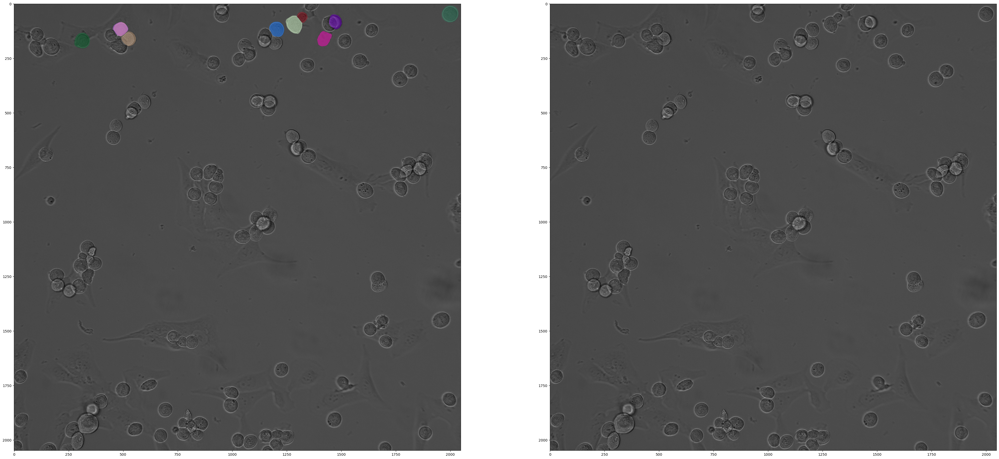

In [12]:
fig, ax = plt.subplots(ncols = 2, figsize = (50,50))

ax[0].imshow(au.bw_to_rgb(instance_whole.phase_image_stack[130]))
ax[1].imshow(au.bw_to_rgb(instance_whole.phase_image_stack[130]))

for i in range(10):
    mask = np.unpackbits(instance_whole.segmentations[130][i], axis = 0, count = 2048)
    mask = np.array([mask]).astype('uint8')
    show_mask(mask, ax[0], random_color = True)

plt.show()


UMAP, for documentation see: https://umap-learn.readthedocs.io/en/latest/parameters.html

In [22]:
df_mapper = umap.UMAP(n_neighbors=15,
                   min_dist=0,
                   n_components=2,
                   random_state=42,).fit(df_whole)

df_embedding = df_mapper.fit_transform(df_whole)

/home/anishjv/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


HDBSCAN Clustering, for documentation see: https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html

In [23]:
labels_whole_embedding = hdbscan.HDBSCAN(min_samples=2,
                                        min_cluster_size = int((1/100) * df_whole.shape[0]),
                                        ).fit_predict(df_embedding)

df_whole_labeled = au.add_labels(df_whole, labels_whole_embedding)

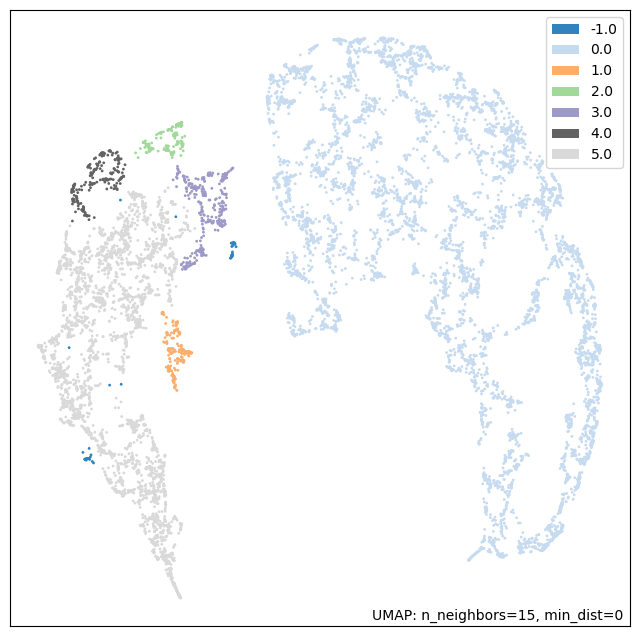

In [24]:
fig = umap.plot.points(df_mapper, labels = df_whole_labeled[:, -1], theme = 'green').get_figure()

In [25]:
clusters = au.write_clusters(df_whole_labeled, -1)
for cluster in clusters.values():
    print(cluster.shape)

(6026, 2)
(189, 2)
(148, 2)
(326, 2)
(233, 2)
(2999, 2)
(60, 2)


Below we display a subset of cells from each cluster.

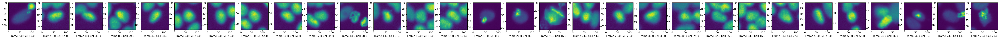

In [92]:
fig, ax = plt.subplots(ncols = 30, figsize = (70,70))

for i in range(30):
    ax[i].imshow(instance_whole.roi[int(clusters[0][i, 0])][int(clusters[0][i, 1])])
    ax[i].set_xlabel(f'Frame {clusters[0][i, 0]} Cell {clusters[0][i, 1]}')

plt.show()

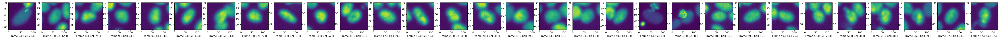

In [93]:
fig, ax = plt.subplots(ncols = 30, figsize = (70,70))

for i in range(30):
    ax[i].imshow(instance_whole.roi[int(clusters[1][i, 0])][int(clusters[1][i, 1])])
    ax[i].set_xlabel(f'Frame {clusters[1][i, 0]} Cell {clusters[1][i, 1]}')

plt.show()

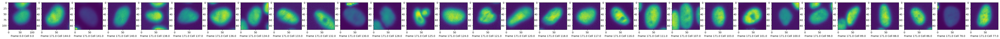

In [94]:
fig, ax = plt.subplots(ncols = 30, figsize = (70,70))

for i in range(30):
    ax[i].imshow(instance_whole.roi[int(clusters[2][-i, 0])][int(clusters[2][-i, 1])])
    ax[i].set_xlabel(f'Frame {clusters[2][-i, 0]} Cell {clusters[2][-i, 1]}')

plt.show()

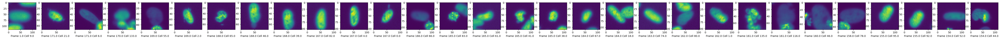

In [95]:
fig, ax = plt.subplots(ncols = 30, figsize = (70,70))

for i in range(30):
    ax[i].imshow(instance_whole.roi[int(clusters[3][-i, 0])][int(clusters[3][-i, 1])])
    ax[i].set_xlabel(f'Frame {clusters[3][-i, 0]} Cell {clusters[3][-i, 1]}')

plt.show()

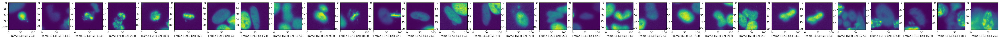

In [96]:
fig, ax = plt.subplots(ncols = 30, figsize = (70,70))

for i in range(30):
    ax[i].imshow(instance_whole.roi[int(clusters[4][-i, 0])][int(clusters[4][-i, 1])])
    ax[i].set_xlabel(f'Frame {clusters[4][-i, 0]} Cell {clusters[4][-i, 1]}')

plt.show()

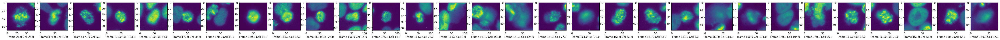

In [136]:
fig, ax = plt.subplots(ncols = 30, figsize = (70,70))

for i in range(30):
    ax[i].imshow(instance_whole.roi[int(clusters[6][-i, 0])][int(clusters[6][-i, 1])])
    ax[i].set_xlabel(f'Frame {clusters[6][-i, 0]} Cell {clusters[6][-i, 1]}')

plt.show()

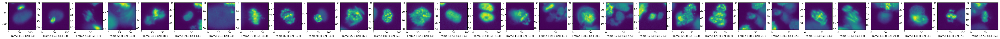

In [26]:
fig, ax = plt.subplots(ncols = 30, figsize = (70,70))

for i in range(30):
    ax[i].imshow(instance_whole.roi[int(clusters['noise'][i, 0])][int(clusters['noise'][i, 1])])
    ax[i].set_xlabel(f'Frame {clusters["noise"][i, 0]} Cell {clusters["noise"][i, 1]}')

plt.show()

We note that HDBSCAN found > 2 clusters. Visually we can see that clusters -1 and 7 are mitotic and that the rest are non-mitotic. We fix the labeling below.

In [27]:
for i in range(df_whole_labeled.shape[0]):
    if df_whole_labeled[i, -1] in [-1, 5]:
        df_whole_labeled[i, -1] = 0 #mitotic
    else:
        df_whole_labeled[i, -1] =1 #non-mitotic
        

Here we make the dataset.

In [30]:
phase_image_stack = instance_whole.phase_image_stack
segmentations = instance_whole.segmentations

splits = [
    (0, 55),
    (56, 171)
] #Breaks the dataset into testing and validation subsets by index of the phase_image_stack. In other words,
  # we split the dataset into subsets by image. You can have as many subsets as you desire. 

dw.write_dataset_ranges(
    '/home/anishjv/cell_seg_classify/',
    phase_image_stack,
    segmentations,
    df_whole_labeled,
    splits,
    'U2OS_0.5',
    {0: 'mitotic', 1: 'nonmitotic'} #Dictionary mapping label in the dataset to category name
)